# Widzenie komputerowe - Laboratoria nr 9

## Opis laboratoriów

- wprowadzenie do kamery i jej parametrów
- zaawansowane techniki przetwarzania obrazów,
- zaawansowane techniki przetwarzania filmów,
- rozumienie sceny jako schematów, obiektów i efektów optycznych,
- modyfikacja obrazów

## Funkcje pomocnicze

### Niezbędne biblioteki


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
import PIL
import os
import sys
import glob
import random

from pprint import pprint
from ipywidgets import Video

from PIL import Image
from PIL.ExifTags import TAGS

### Zbiory danych

* zbiór obrazów stereoskopowych do kalibracji parametrów kamery 

In [ ]:
!rm -rf ./cam_cal
!mkdir cam_cal
!wget -O cam_cal/left01.jpg https://github.com/opencv/opencv/raw/master/samples/data/left01.jpg -q --show-progress
!wget -O cam_cal/left02.jpg https://github.com/opencv/opencv/raw/master/samples/data/left02.jpg -q --show-progress
!wget -O cam_cal/left03.jpg https://github.com/opencv/opencv/raw/master/samples/data/left03.jpg -q --show-progress
!wget -O cam_cal/left04.jpg https://github.com/opencv/opencv/raw/master/samples/data/left04.jpg -q --show-progress
!wget -O cam_cal/left05.jpg https://github.com/opencv/opencv/raw/master/samples/data/left05.jpg -q --show-progress
!wget -O cam_cal/left06.jpg https://github.com/opencv/opencv/raw/master/samples/data/left06.jpg -q --show-progress
!wget -O cam_cal/left07.jpg https://github.com/opencv/opencv/raw/master/samples/data/left07.jpg -q --show-progress
!wget -O cam_cal/left08.jpg https://github.com/opencv/opencv/raw/master/samples/data/left08.jpg -q --show-progress
!wget -O cam_cal/left09.jpg https://github.com/opencv/opencv/raw/master/samples/data/left09.jpg -q --show-progress
!wget -O cam_cal/left11.jpg https://github.com/opencv/opencv/raw/master/samples/data/left11.jpg -q --show-progress
!wget -O cam_cal/left12.jpg https://github.com/opencv/opencv/raw/master/samples/data/left12.jpg -q --show-progress
!wget -O cam_cal/left13.jpg https://github.com/opencv/opencv/raw/master/samples/data/left13.jpg -q --show-progress
!wget -O cam_cal/left14.jpg https://github.com/opencv/opencv/raw/master/samples/data/left14.jpg -q --show-progress

!wget -O cam_cal/right01.jpg https://github.com/opencv/opencv/raw/master/samples/data/right01.jpg -q --show-progress
!wget -O cam_cal/right02.jpg https://github.com/opencv/opencv/raw/master/samples/data/right02.jpg -q --show-progress
!wget -O cam_cal/right03.jpg https://github.com/opencv/opencv/raw/master/samples/data/right03.jpg -q --show-progress
!wget -O cam_cal/right04.jpg https://github.com/opencv/opencv/raw/master/samples/data/right04.jpg -q --show-progress
!wget -O cam_cal/right05.jpg https://github.com/opencv/opencv/raw/master/samples/data/right05.jpg -q --show-progress
!wget -O cam_cal/right06.jpg https://github.com/opencv/opencv/raw/master/samples/data/right06.jpg -q --show-progress
!wget -O cam_cal/right07.jpg https://github.com/opencv/opencv/raw/master/samples/data/right07.jpg -q --show-progress
!wget -O cam_cal/right08.jpg https://github.com/opencv/opencv/raw/master/samples/data/right08.jpg -q --show-progress
!wget -O cam_cal/right09.jpg https://github.com/opencv/opencv/raw/master/samples/data/right09.jpg -q --show-progress
!wget -O cam_cal/right11.jpg https://github.com/opencv/opencv/raw/master/samples/data/right11.jpg -q --show-progress
!wget -O cam_cal/right12.jpg https://github.com/opencv/opencv/raw/master/samples/data/right12.jpg -q --show-progress
!wget -O cam_cal/right13.jpg https://github.com/opencv/opencv/raw/master/samples/data/right13.jpg -q --show-progress
!wget -O cam_cal/right14.jpg https://github.com/opencv/opencv/raw/master/samples/data/right14.jpg -q --show-progress

cam_cal/left01.jpg  100%[===================>]  27.25K  --.-KB/s    in 0.002s  
cam_cal/left02.jpg  100%[===================>]  27.94K  --.-KB/s    in 0.002s  
cam_cal/left03.jpg  100%[===================>]  28.86K  --.-KB/s    in 0.002s  
cam_cal/left04.jpg  100%[===================>]  24.56K  --.-KB/s    in 0.001s  
cam_cal/left05.jpg  100%[===================>]  28.07K  --.-KB/s    in 0.002s  
cam_cal/left06.jpg  100%[===================>]  27.86K  --.-KB/s    in 0.002s  
cam_cal/left07.jpg  100%[===================>]  29.16K  --.-KB/s    in 0.002s  
cam_cal/left08.jpg  100%[===================>]  28.02K  --.-KB/s    in 0.002s  
cam_cal/left09.jpg  100%[===================>]  26.61K  --.-KB/s    in 0.001s  
cam_cal/left11.jpg  100%[===================>]  27.10K  --.-KB/s    in 0.002s  
cam_cal/left12.jpg  100%[===================>]  25.00K  --.-KB/s    in 0.001s  
cam_cal/left13.jpg  100%[===================>]  27.47K  --.-KB/s    in 0.002s  
cam_cal/left14.jpg  100%[===============

* obrazy stereoskopowe pochodzące ze zbioru danych Middlesbury dostępnego pod [linkiem](https://vision.middlebury.edu/stereo/data/scenes2006/).

In [ ]:
!gdown --id 17g5lfQkqXSIfJQLA2UHBZdoiD5PvV_tu
!gdown --id 176GBMR2o4_sYaPIo8Sdr3izTf4lilfVP

Downloading...
From: https://drive.google.com/uc?id=17g5lfQkqXSIfJQLA2UHBZdoiD5PvV_tu
To: /content/right-aloe-image.png
100% 208k/208k [00:00<00:00, 29.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=176GBMR2o4_sYaPIo8Sdr3izTf4lilfVP
To: /content/left-aloe-image.png
100% 208k/208k [00:00<00:00, 71.6MB/s]


* sudoku - przykładowy obraz sudoku z repozytorium OpenCV,

In [ ]:
!wget -O sudoku.png https://raw.githubusercontent.com/opencv/opencv/master/samples/data/sudoku.png -q --show-progress

sudoku.png          100%[===================>] 244.84K  --.-KB/s    in 0.03s   


* skittles - obraz skittlesów pochodzący z wikimedia.org

In [ ]:
!wget -O skittles.jpg https://upload.wikimedia.org/wikipedia/commons/c/ca/Skittles-Louisiana-2003.jpg -q --show-progress

skittles.jpg        100%[===================>] 766.67K  --.-KB/s    in 0.1s    


* kadr z meczu piłki nożnej pomiędzy reprezentacjami polski i anglii oraz fragment kadru, który posłuży jako wzór dla algorytmu wyktywania wzorców

In [ ]:
!gdown --id 1D-GbfGKqn982VG43SSB62-PIiv0QXuoZ
!gdown --id 17jZaa3iQO78Bjgk1W3EYBFE7RXKQ7gcM

Downloading...
From: https://drive.google.com/uc?id=1D-GbfGKqn982VG43SSB62-PIiv0QXuoZ
To: /content/pl_eng.png
100% 853k/853k [00:00<00:00, 56.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=17jZaa3iQO78Bjgk1W3EYBFE7RXKQ7gcM
To: /content/template.png
100% 19.4k/19.4k [00:00<00:00, 15.5MB/s]


* parametry klasyfikatora Haar Cascade do rozpoznawania twarzy oraz oczu (osobno)

In [ ]:
!wget -O haar_face.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt.xml -q --show-progress
!wget -O haar_eye.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye_tree_eyeglasses.xml -q --show-progress

!gdown --id 10b2rtAv_blqJT1VsEgeOE7GbhZcgLdTV

haar_face.xml       100%[===================>] 660.85K  --.-KB/s    in 0.05s   
haar_eye.xml        100%[===================>] 587.56K  --.-KB/s    in 0.05s   
Downloading...
From: https://drive.google.com/uc?id=10b2rtAv_blqJT1VsEgeOE7GbhZcgLdTV
To: /content/face.jpeg
100% 433k/433k [00:00<00:00, 55.7MB/s]


* fragment filmu prezentacyjnego artykuł naukowy dotyczący generowania ruchów robota na podstawie muzyki różnych typów ([link](https://www.youtube.com/watch?v=kHBLaw5nfzk)) - robot znajduje się na Politechnice Poznańskiej,

In [ ]:
!gdown --id 1lJF5LX6m1KbgNGI2pJBQJVgEaU0VdUuF

Downloading...
From: https://drive.google.com/uc?id=1lJF5LX6m1KbgNGI2pJBQJVgEaU0VdUuF
To: /content/anymal_cut.mp4
100% 948k/948k [00:00<00:00, 59.1MB/s]


* film pochodzący z repozytorium OpenCV,

In [ ]:
!wget -O slow_traffic_small.mp4 https://www.bogotobogo.com/python/OpenCV_Python/images/mean_shift_tracking/slow_traffic_small.mp4 -q --show-progress

slow_traffic_small. 100%[===================>]   1.92M  8.14MB/s    in 0.2s    


* obrazy wykonane z różnym czasem naświetlania, zawierające ten sam obiekt. Obrazy pochodzą ze zbioru danych dostępnego pod [linkiem](http://pages.cs.wisc.edu/~csverma/CS766_09/HDRI/hdr.html) (Chaman Singh Verma i Mon-Ju).

In [ ]:
!mkdir -p hdr
!wget -O hdr.tar http://pages.cs.wisc.edu/~csverma/CS766_09/HDRI/DataSet/Set3/set3images.tar -q --show-progress
!tar -xf hdr.tar -C ./hdr

hdr.tar             100%[===================>]  41.76M  2.97MB/s    in 14s     


* fragment meczu angielskiej Premiere League pomiędzy Manchesterem United oraz Chelsea London.

In [ ]:
!gdown --id 16-H5SnEloiRgnSj_qtKNy0BTkJQZXi6c

Downloading...
From: https://drive.google.com/uc?id=16-H5SnEloiRgnSj_qtKNy0BTkJQZXi6c
To: /content/free_kick.mp4
100% 510k/510k [00:00<00:00, 57.1MB/s]


### Wizualizacja



Skrypt do wyżwietlania obrazów BGR oraz Grayscale.

In [ ]:
def imshow(a):
  a = a.clip(0, 255).astype('uint8')
  if a.ndim == 3:
    if a.shape[2] == 4:
      a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
    else:
      a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
  display(PIL.Image.fromarray(a))

# Kamera

## Kalibracja

Obraz powstały poprzez naświetlanie matrycy układu aparatu fotograficznego jest zniekształcony, a zniekształcenie wynika z indywidualnych (unikalnych) parametrów kamery.

Aby wyeliminować zniekształcenia, każdy aparat powinien być skalibrowany a otrzymane parametry kalibracji powinny być wykorzystane do późniejszej obróbki obrazów.

Jednym z efektów zniekształcenia obrazu jest efekt zakrzywionych lini, które znajdują się dalej od środka obrazu. Efekt ten, można zaobserwować na wizualizacji poniżej.

Do kalibracji wykorzystuje się szachownice, które w rzeczywistości powinny być płaszczyznami (tzn. fizycznie nie powinny zawierać niedoskonałości).
Znając rozmiar szachownicy (np. 6x7) oraz wiedząc, że odległości pomiędzy kolejnymi kafelkami są takie same, możemy wyliczyć analitycznie jaki jest błąd pomiędzy obrazem powstałym na matrycy. a rzeczywistością.

Obrazy wykorzystane do obliczenia parametrów kamery:


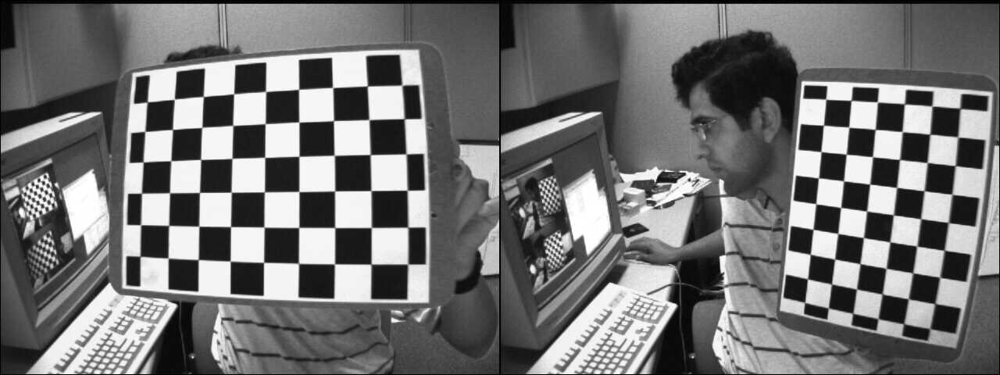

Obrazy pozostałe:


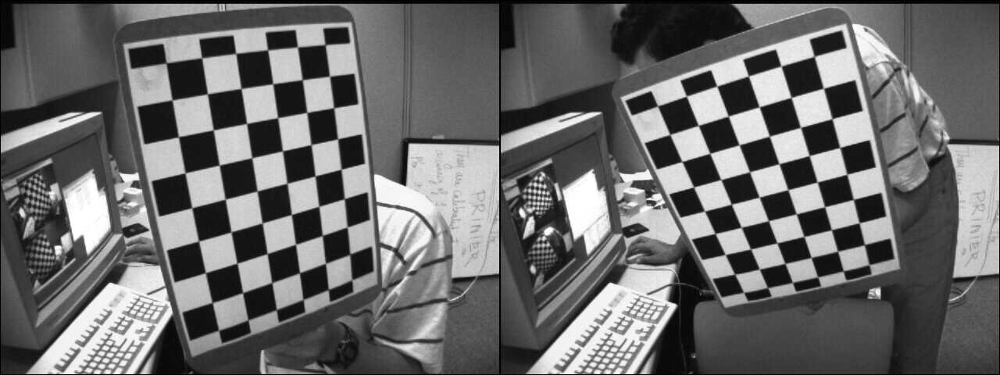

In [ ]:
img_calib = [cv2.imread(path, cv2.IMREAD_COLOR) for path in glob.glob('./cam_cal/left0*.jpg')]
img_calib_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in img_calib]
img_calib_shape = tuple({img.shape for img in img_calib_gray})[0]

img_uncalib = [cv2.imread(path, cv2.IMREAD_COLOR) for path in glob.glob('./cam_cal/left1*.jpg')]
img_uncalib_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in img_uncalib]
img_uncalib_shape = tuple({img.shape for img in img_calib_gray})[0]

print('Obrazy wykorzystane do obliczenia parametrów kamery:')
imshow(np.concatenate(random.sample(img_calib, 2), 1))

print('Obrazy pozostałe:')
imshow(np.concatenate(random.sample(img_uncalib, 2), 1))

In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((6*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)
pprint(objp[:10])

array([[0., 0., 0.],
       [1., 0., 0.],
       [2., 0., 0.],
       [3., 0., 0.],
       [4., 0., 0.],
       [5., 0., 0.],
       [6., 0., 0.],
       [0., 1., 0.],
       [1., 1., 0.],
       [2., 1., 0.]], dtype=float32)


Do kalibracji niezbędne będzie znalezienie narożników znajdujących się na szachownicy. Można wykorzystać funkcję cv2.findChessboardCorners z odpowiednim parametrem, aby wyznaczyć lokalizację pikseli odpowiadającym narożnikom.

In [ ]:
objpoints, imgpoints = [], []
for img, img_gray in zip(img_calib, img_calib_gray):
    ret, corners = cv2.findChessboardCorners(img_gray, (7,6), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        corners2 = cv2.cornerSubPix(img_gray, corners, (11,11), (-1,-1), criteria)
        cv2.drawChessboardCorners(img, (7,6), corners2, ret)

Obrazy wykorzystane do obliczenia parametrów kamery:


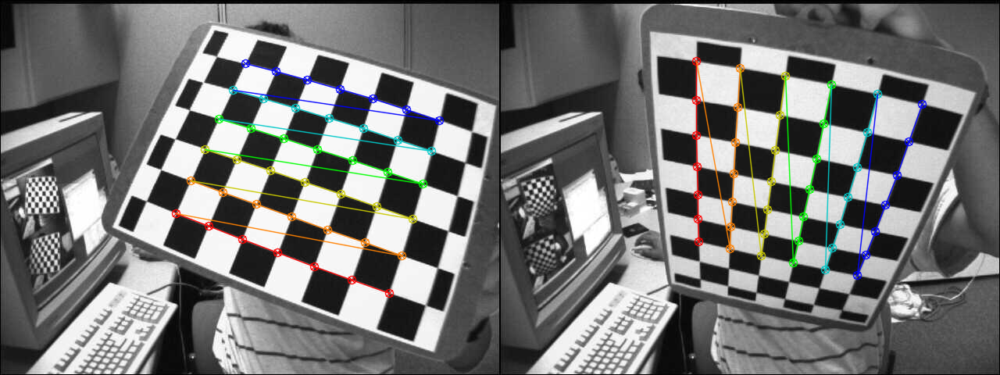

In [ ]:
print('Obrazy wykorzystane do obliczenia parametrów kamery:')
imshow(np.concatenate(random.sample(img_calib, 2), 1))


Ostatnim krokiem jest podanie pary: indeksy punktów (aby wiedzieć która lokalizacja to który narożnik) oraz ich lokalizacje na kolejnych obrazach.

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_calib_shape[::-1], None, None)

Posiadając parametry wewnętrzne możemy każde nowe zdjęcie, pochodzące z tego obrazu, transformować w taki sposób, aby pozbyć się zniekształceń.

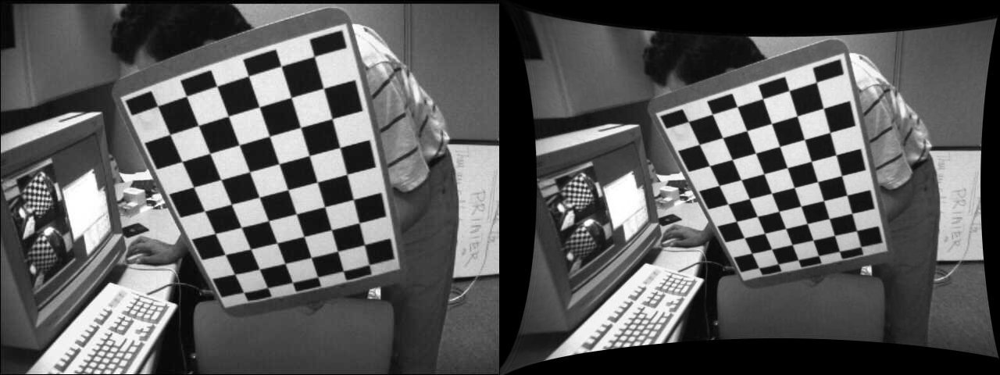

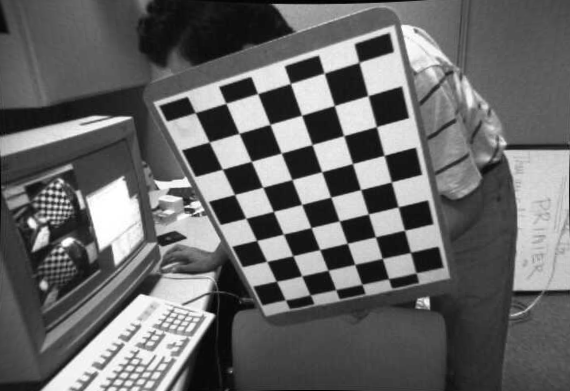

In [ ]:
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, img_uncalib_shape[::-1], 1, img_uncalib_shape[::-1])
dst = cv2.undistort(img_uncalib[0], mtx, dist, None, newcameramtx)

imshow(np.concatenate([img_uncalib[0], dst], 1))

x, y, w, h = roi
dst = dst[y:y+h, x:x+w]

imshow(dst)

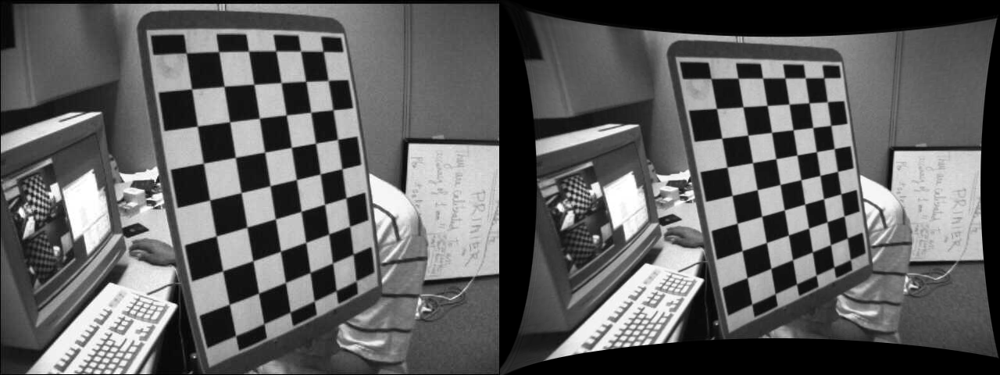

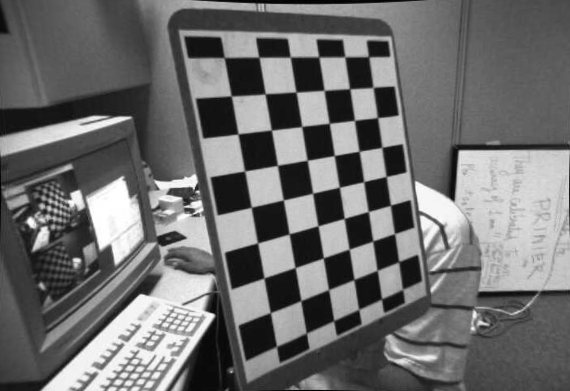

In [ ]:
mapx, mapy = cv2.initUndistortRectifyMap(mtx, dist, None, newcameramtx, img_uncalib_shape[::-1], 5)
dst = cv2.remap(img_uncalib[1], mapx, mapy, cv2.INTER_LINEAR)

imshow(np.concatenate([img_uncalib[1], dst], 1))

x, y, w, h = roi
dst = dst[y:y+h, x:x+w]

imshow(dst)

In [ ]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error
print( "total error: {}".format(mean_error/len(objpoints)) )

total error: 0.023287281568315835


## Estymacja pozy

Posiadając skalibrowaną kamerę oraz znając parametry pewnego obiektu na obrazie (jakiś punkt referencyjny, jak szachownica) możemy estymować pozę tego obiektu.

Przez pozę, należy rozumieć przesunięcie oraz rotację obiektu względem początku współrzędnych danej przestrzeni. Ponieważ znamy parametry kamery, wiemy jaka jest ogniskowa, i jakie rozmiary mają piksele, naszym układem współrzędnych może być układ kamery.

Natomiast, znając położenie szachownicy (które możemy obliczyć znajdując piksele odpowiadające narożnikom szachownicy, możemy również opisać obiekty na scenie względem układu współrzędnego szachownicy.

W poniższym przykładnie, początku układu współrzędnych szachownicy, rysowane są 3 osie (x, y, z) o długości 3. Warto zauważyć, że odległość ''1'' w układzie szachownicy odpowiada długości 1 kafelka szachownicy.

In [ ]:
def draw(img, corners, imgpts):
    corners = corners.astype(int)
    imgpts = imgpts.astype(int)
    corner = tuple(corners[0].ravel())
    img = cv2.line(img, corner, tuple(imgpts[0].ravel()), (255,0,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[1].ravel()), (0,255,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[2].ravel()), (0,0,255), 5)
    return img

In [ ]:
axis = np.float32([[3,0,0], [0,3,0], [0,0,-3]]).reshape(-1,3)

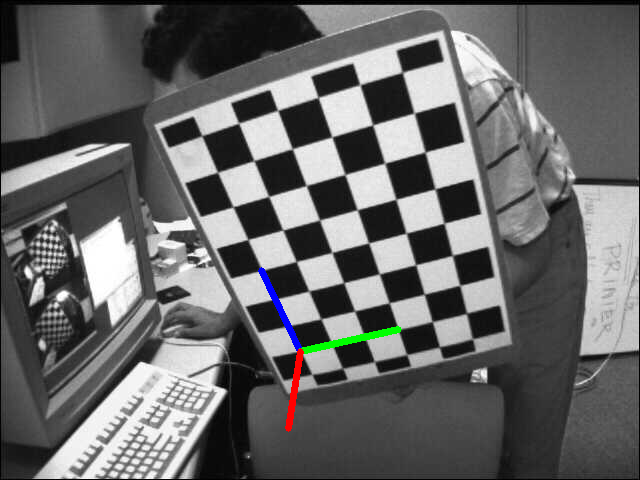

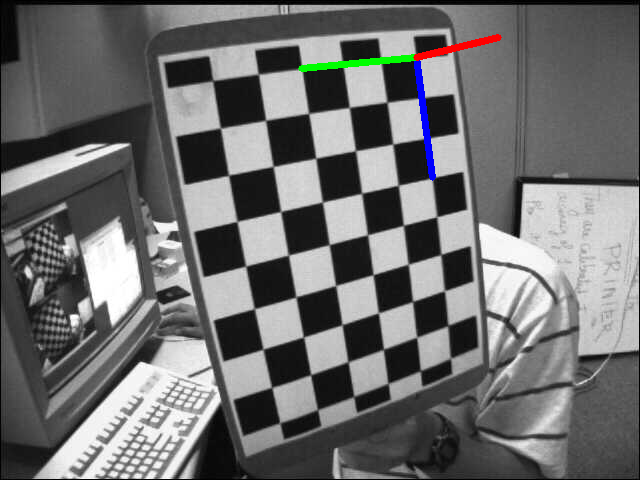

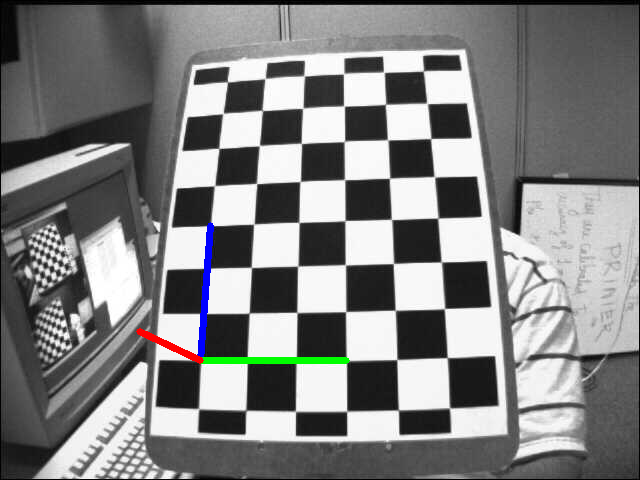

In [ ]:
for img, img_gray in zip(img_uncalib, img_uncalib_gray):
    ret, corners = cv2.findChessboardCorners(img_gray, (7,6), None)
    if ret == True:
        corners2 = cv2.cornerSubPix(img_gray, corners, (11,11), (-1, -1), criteria)
        # Find the rotation and translation vectors.
        ret, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)
        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img, corners2, imgpts)
        imshow(img)

In [ ]:
def draw(img, corners, imgpts):
    imgpts = np.int32(imgpts).reshape(-1,2)
    img = cv2.drawContours(img, [imgpts[:4]],-1,(0,255,0),-3)
    for i,j in zip(range(4),range(4,8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]),(255),3)
    img = cv2.drawContours(img, [imgpts[4:]],-1,(0,0,255),3)
    return img

In [ ]:
axis = np.float32([[0,0,0], [0,3,0], [3,3,0], [3,0,0],
                   [0,0,-3],[0,3,-3],[3,3,-3],[3,0,-3] ])

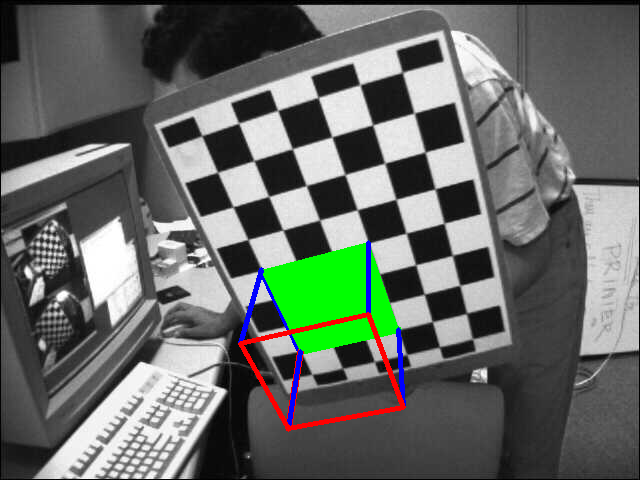

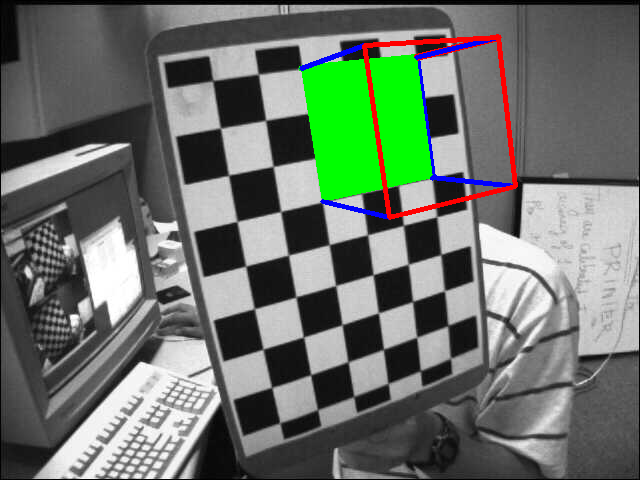

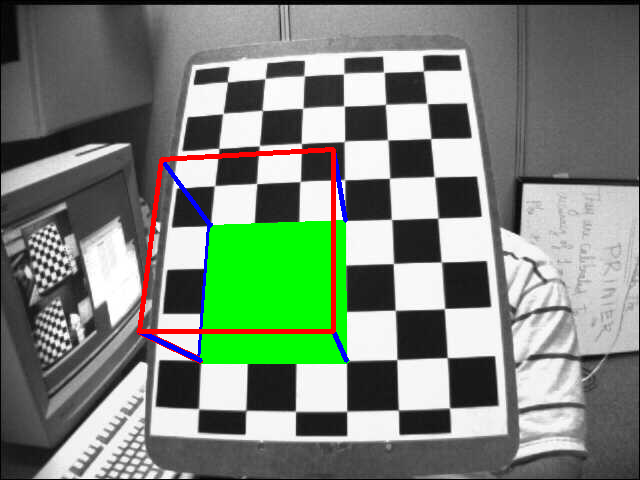

In [ ]:
for img, img_gray in zip(img_uncalib, img_uncalib_gray):
    ret, corners = cv2.findChessboardCorners(img_gray, (7,6), None)
    if ret == True:
        corners2 = cv2.cornerSubPix(img_gray, corners, (11,11), (-1, -1), criteria)
        ret, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img, corners2, imgpts)
        imshow(img)

## Estymacja głębii

Człowiek patrząc dwojgiem oczu jest w stanie ''wyczuć'' odległość od obiektu na który patrzy. Za tę umiejętność odpowiada (głównie) stereowizja - możliwość analizy tego samego obiektu z 2 źródeł obrazu, pomiędzy którymi **znamy transformację**.

**Uwaga:** obecnie prowadzone badania co raz bardziej skłaniają sie ku tezie, że głębia również może być ''wydobyta'' z samego opisu sceny (jak segmentacja, znajomość podstawowych kształtów, a nawet podstawowych praw fizyki).

OpenCV zawiera gotowy algorytm do estymacji głębi obrazu ze stereowizji. Algorytm ten nie zawiera w sobie funkcjonalności estymacji bezpośredniej głębii (rozumianej jako odległość od kamery). Więcej szczegółów dotyczących algorytmu można znaleźć w samym artykule: [link](https://www.cs.cmu.edu/~motionplanning/papers/sbp_papers/integrated1/konolidge_stereo_vision.pdf).

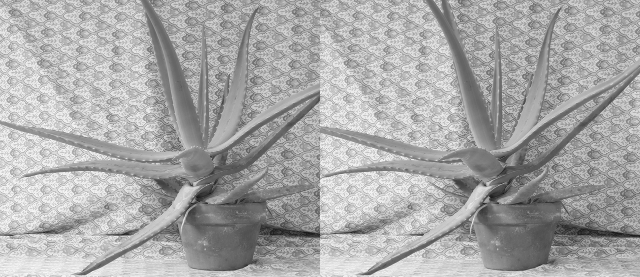

In [ ]:
img_left = cv2.imread('left-aloe-image.png', 0)
img_right = cv2.imread('right-aloe-image.png', 0)
imshow(np.concatenate([img_left, img_right], 1))

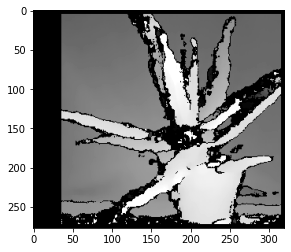

In [ ]:
stereo = cv2.StereoBM_create(numDisparities=32, blockSize=11)
disparity = stereo.compute(img_left, img_right)
plt.imshow(disparity,'gray')
plt.show()

# Obraz

## Wykrywanie kształtów

Obraz rozumiany jako funkcja może zawierać pewne charakterystyczne obszary. Takimi obszarami mogą być linie, okręgi lub inne figury geometryczne, które można w przybliżeniu opisać matematycznie, jednocześnie projektując algorytm do ich znajdowania.

Najczęściej wykorzystywanym algorytmem do wykrywania lini i okręgów jest transformata Hougha. Algorytm ten opiera się na sprawdzeniu wszystkich możliwych prostych przechodzących przez wykryty punkt (np. na podstawie wykrywania krawędzi laplasjanem) i głosowaniu która prosta najczęściej występuje na obrazie.

Algorytm analogicznie działa dla okręgów, a idea z której pochodzi algorytm to transformata Radona, która z kolei w podobny sposób jest wykorzystywana w obrazowaniu rezonansu elektromagnetycznego.

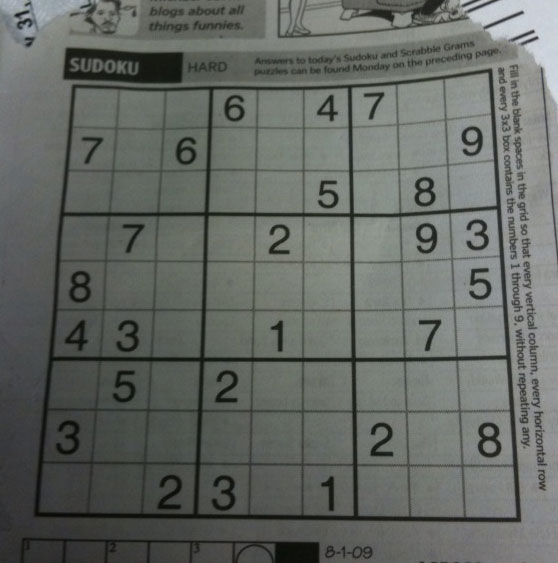

In [ ]:
sudoku = cv2.imread('./sudoku.png', cv2.IMREAD_COLOR)
imshow(sudoku)

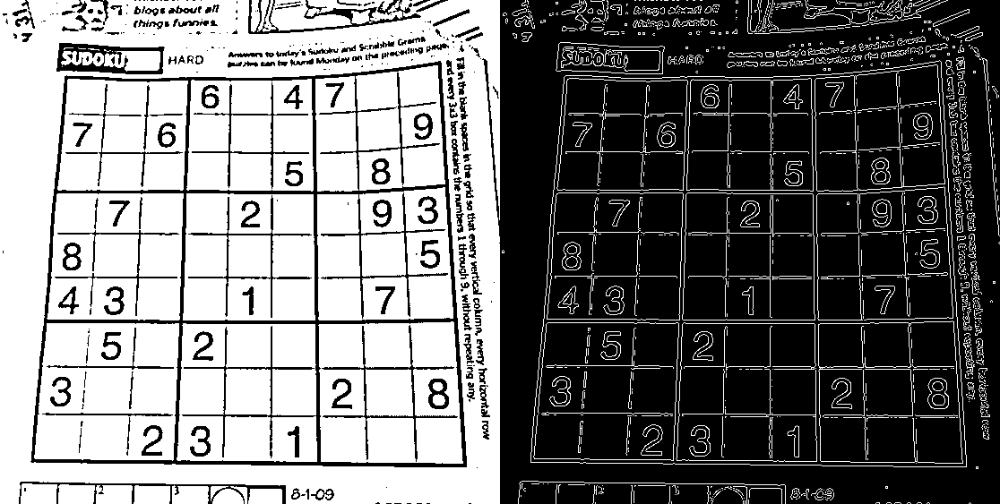

In [ ]:
sudoku_gray = cv2.cvtColor(sudoku, cv2.COLOR_BGR2GRAY)
sudoku_th = cv2.adaptiveThreshold(sudoku_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 10)
sudoku_edges = cv2.Canny(sudoku_th, 50, 150, apertureSize=3)

imshow(np.concatenate([sudoku_th, sudoku_edges], 1))

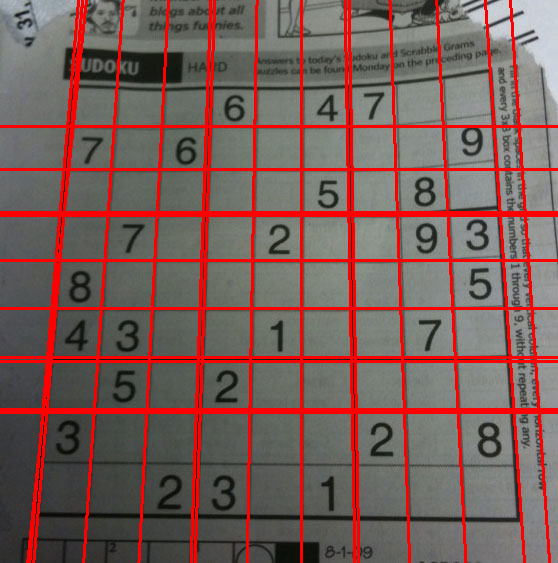

In [ ]:
_sudoku = sudoku.copy()
lines = cv2.HoughLines(sudoku_edges, 1, np.pi/180, 180)
for line in lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(_sudoku, (x1, y1), (x2, y2), (0, 0, 255), 2)
imshow(_sudoku)

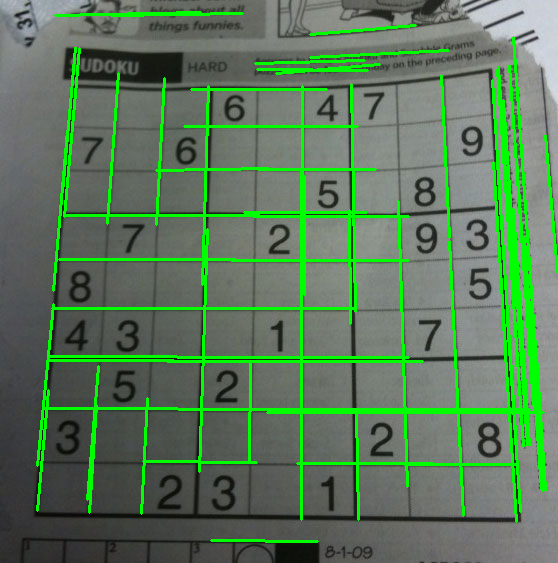

In [ ]:
_sudoku = sudoku.copy()
lines = cv2.HoughLinesP(sudoku_edges, 1, np.pi/180, 100, minLineLength=100, maxLineGap=10)
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(_sudoku, (x1, y1), (x2, y2), (0, 255, 0), 2)
imshow(_sudoku)

Znalezionych okręgów: 57


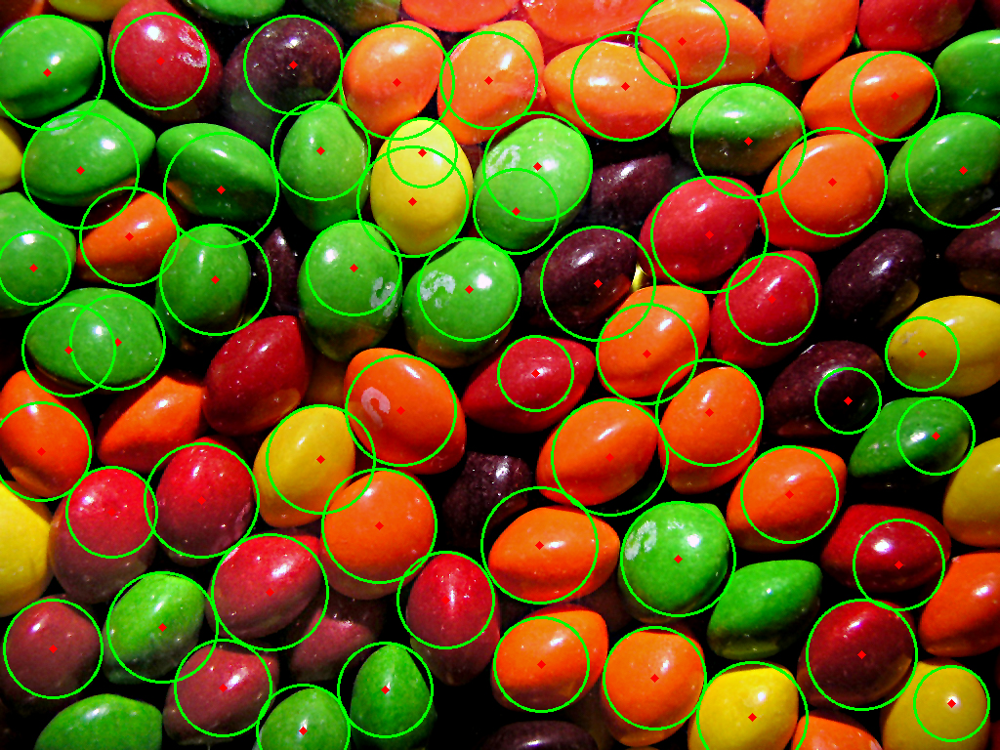

In [ ]:
skittles = cv2.imread('./skittles.jpg', cv2.IMREAD_COLOR)
skittles_gray = cv2.cvtColor(skittles, cv2.COLOR_BGR2GRAY)

circles = cv2.HoughCircles(skittles_gray, cv2.HOUGH_GRADIENT, 1, 50, param1=200, param2=15, minRadius=30, maxRadius=60)
circles = np.uint16(np.around(circles))
print('Znalezionych okręgów:', len(circles[0]))
for i in circles[0, :]:
    cv2.circle(skittles,(i[0],i[1]),i[2],(0,255,0),2)
    cv2.circle(skittles,(i[0],i[1]),2,(0,0,255),3)
imshow(skittles)

## Wykrywanie schematów

Przy okazji zajęć o operacjach morfologicznych wprowadzona została pewna idea stojąca za operacją korelacji (lub konwolucji). Dla znormalizowanych danych, wynikiem operacji korelacji 2 funkcji będzie obraz na którym największe wartości będą miały miejsca, w których dany podobszar jest najbardziej podobny do drugiego obrazu.

Biblioteka OpenCV zawiera funkcję ''matchTemplate()'', która realizuje powyższy schemat, również dla obrazów wielokanałowych.

Poniżej został przedstawiony kadr z transmisji meczu piłkarskiego. Jako szukany wzór określony został jeden z piłkarzy. Jako, że piłkarze posiadają stroje o tej samej kolorystyce, algorytm powinien w pierwszej kolejności znaleźć piłkarzy z tego samego zespołu.

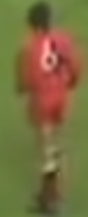

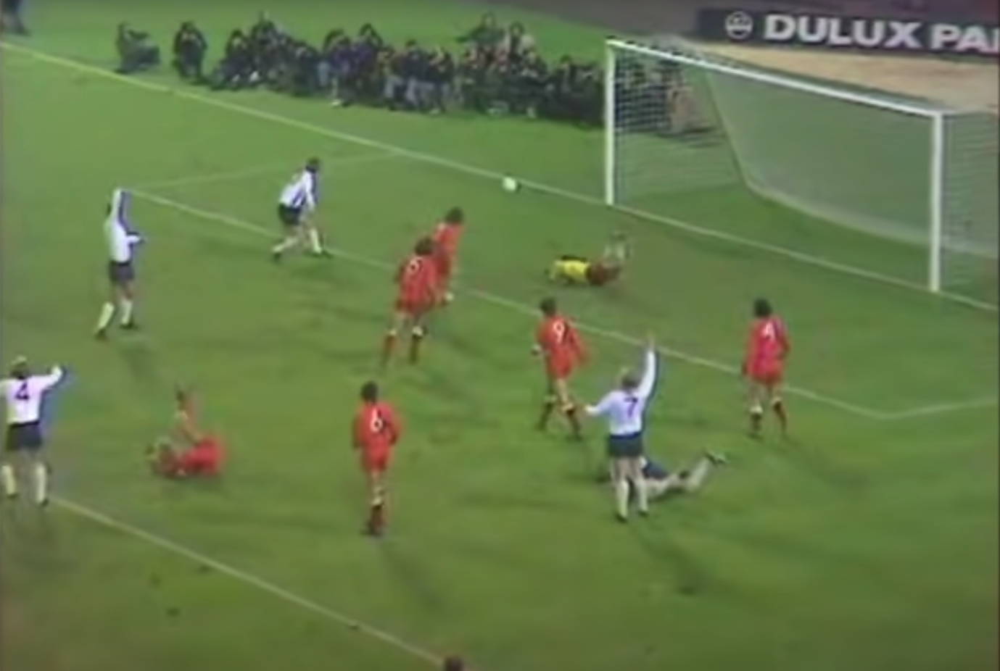

In [ ]:
pleng = cv2.imread('./pl_eng.png', cv2.IMREAD_COLOR)
pleng_template = cv2.imread('./template.png', cv2.IMREAD_COLOR)
_, w, h = pleng_template.shape[::-1]

imshow(pleng_template)
imshow(pleng)

In [ ]:
methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]
results_rgb = []
results_prob = []
for method in methods:
  _pleng = pleng.copy()
  # Apply template Matching
  res = cv2.matchTemplate(_pleng, pleng_template, method)
  min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
  # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
  if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
      top_left = min_loc
  else:
      top_left = max_loc
  bottom_right = (top_left[0] + w, top_left[1] + h)
  cv2.rectangle(_pleng, top_left, bottom_right, (255, 0, 0), 2)

  results_rgb.append(_pleng)
  results_prob.append((res - res.min()) * 255 / (res.max() - res.min()))

imshow(np.concatenate(results_prob, 1))
imshow(np.concatenate(results_rgb, 1))

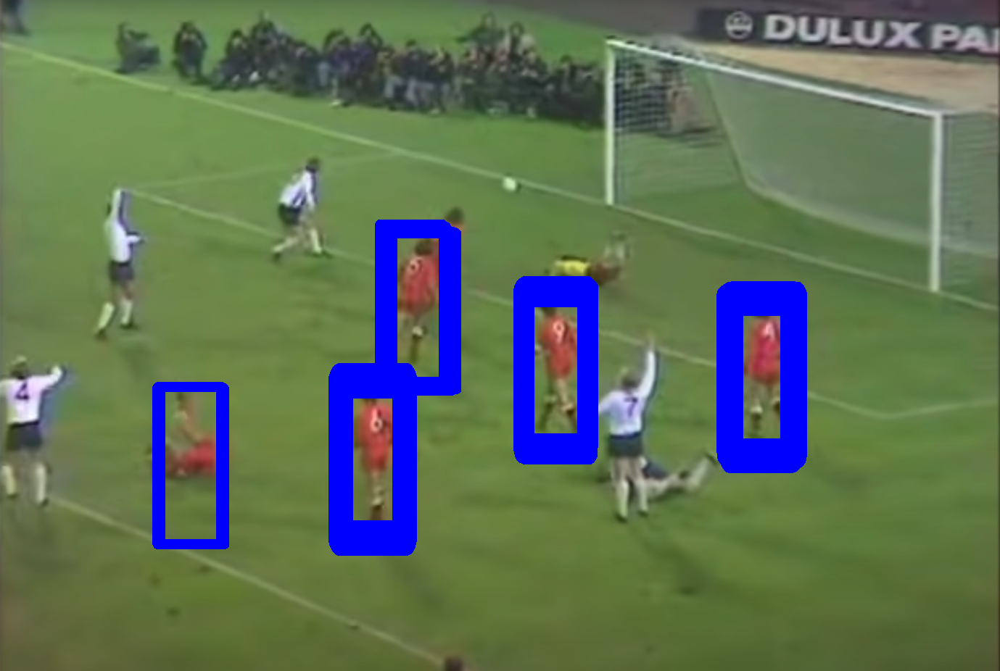

In [ ]:
_pleng = pleng.copy()

res = cv2.matchTemplate(_pleng, pleng_template, cv2.TM_CCOEFF_NORMED)
loc = np.where(res >= 0.4)
for pt in zip(*loc[::-1]):
    cv2.rectangle(_pleng, pt, (pt[0] + w, pt[1] + h), (255, 0, 0), 2)
  
imshow(_pleng)

## Wykrywanie twarzy

Jednym z pierwszych algorytmów wykrywania twarzy był ten zaproponowany przez autorów Paul Viola oraz Michael Jones w pracy ''Rapid Object Detection using a Boosted Cascade of Simple Features'' (2001). Algorytm dla zdefiniowanych wcześniej masek binarnych (np. horyzontalny albo wertykalny podział obrazu na pół, szachownica, itp.) oblicza średnią intensywność pikseli pod każdym z obszarów na masce. Obliczone deskryptory służą następnie do nauki algorytmu uczenia maszynowego - Cascade Classifiers.

Ponieważ jest to algorytm uczenia maszynowego, niezbędy jest etap treningu modelu, a przy każdej jego inferencji niezbędne jest korzystanie z wcześniej obliczonych parametrów optymalizujących pracę algorytmu.



In [ ]:
face_detector = cv2.CascadeClassifier()
eye_detector = cv2.CascadeClassifier()

if face_detector.load('haar_face.xml'):
  print('Detektor twarzy wczytany')

if eye_detector.load('haar_eye.xml'):
  print('Detektor oczu wczytany')

Detektor twarzy wczytany
Detektor oczu wczytany


In [ ]:
def detect_face(img, face_detector, eye_detector):
  img = img.copy()
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_gray = cv2.equalizeHist(img_gray)
  
  faces = face_detector.detectMultiScale(img_gray)
  for (x, y, w, h) in faces:
    center = (x + w//2, y + h//2)
    frame = cv2.ellipse(img, center, (w//2, h//2), 0, 0, 360, (255, 0, 255), 4)
    img_face = img_gray[y:y+h,x:x+w]

    eyes = eye_detector.detectMultiScale(img_face)
    for (x2, y2, w2, h2) in eyes:
      eye_center = (x + x2 + w2//2, y + y2 + h2//2)
      radius = int(round((w2 + h2) * 0.25))
      frame = cv2.circle(img, eye_center, radius, (255, 0, 0 ), 4)
  imshow(img)

Obraz wygenerowany przez: https://arxiv.org/abs/1912.04958 
(https://thispersondoesnotexist.com/)

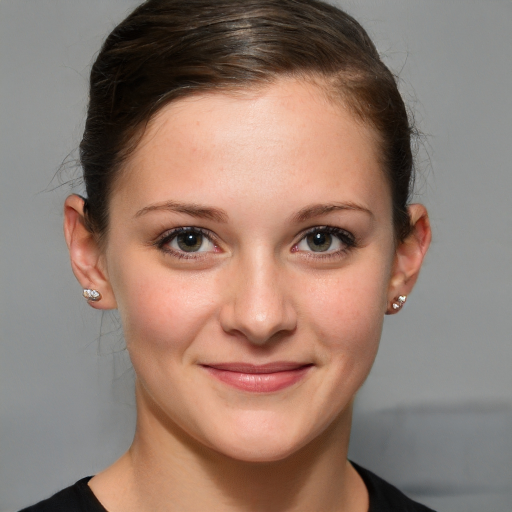

In [ ]:
face = cv2.imread('./face.jpeg', cv2.IMREAD_COLOR)
face = cv2.resize(face, (512, 512))
imshow(face)

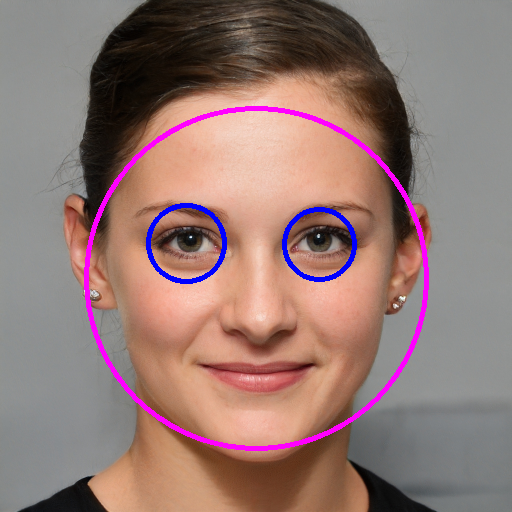

In [ ]:
detect_face(face, face_detector, eye_detector)

## Rozdzielczość obrazu

### Poprawa jakości

Wśród funkcjonalności biblioteki OpenCV można znaleźć również operacje poprawy jakości obrazów. Jedną z nich jest operacja usuwania szumu z obrazu.

Operacja ''fastNlMeansDenoisingColored'' oparta jest na artykule [link](http://www.ipol.im/pub/art/2011/bcm_nlm/) który opisuje algorytm usuwania szumu na podstawie podobieństwa i liczebności wartości intensywności pikseli z sąsiedztwa.

Aby zaprezentować działanie algorytmu do obrazu najpierw zostanie dodany szum, a następnie korzystając z biblioteki OpenCV zostanie podjęta próba usunięcia tego szumu.

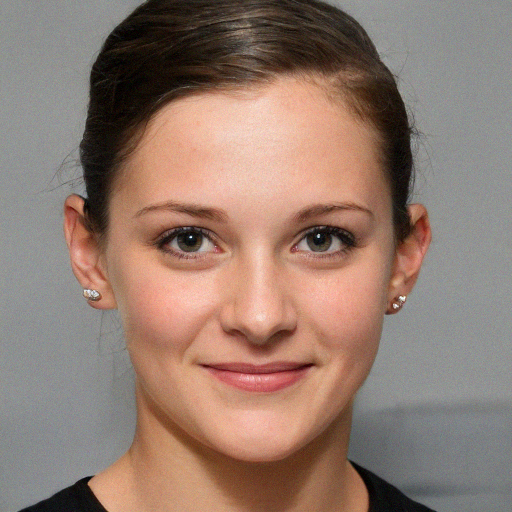

In [ ]:
face_noise = face.astype(np.float32) + np.random.normal(0, 5, face.shape)
face_noise = np.clip(face_noise, 0, 255).astype(np.uint8)

imshow(face_noise)

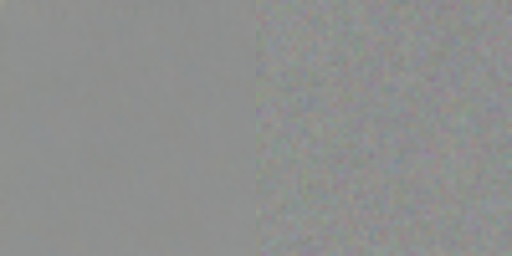

In [ ]:
n1 = cv2.resize(face[:50, :50], (256, 256))
n2 = cv2.resize(face_noise[:50, :50], (256, 256))
imshow(np.concatenate([n1, n2], 1))

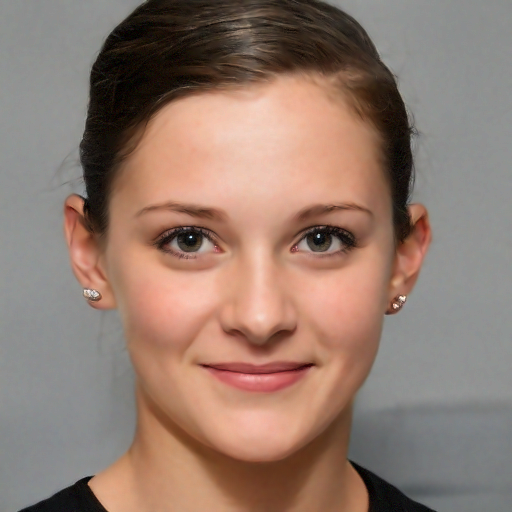

In [ ]:
face_denoise = cv2.fastNlMeansDenoisingColored(face_noise, None, 7, 7, 7, 5)
imshow(face_denoise)

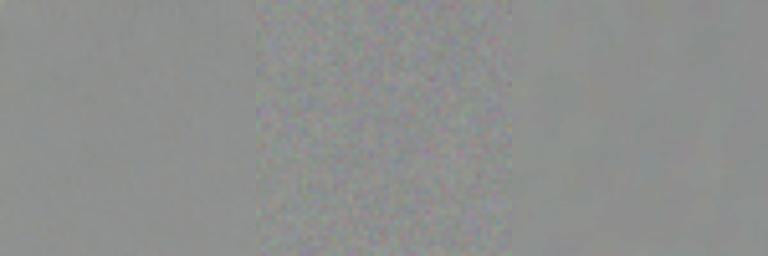

In [ ]:
n3 = cv2.resize(face_denoise[:50, :50], (256, 256))
imshow(np.concatenate([n1, n2, n3], 1))

### Uzupełnienie obszarów

Problem uzupełniania obszarów polega na obliczeniu intensywności brakujących pikseli na podstawie pozostałego fragmentu obrazu. Uzupełnienie może opierać się na najbliższym sąsiedztwie, na rozumieniu semantycznym sceny albo na informacji od użytkownika, co ma znajdować się w tym miejscu.

OpenCV zawiera implementację algorytmów zaproponowanych w pracach [An Image Inpainting Technique Based on
the Fast Marching Method](http://www.olivier-augereau.com/docs/2004JGraphToolsTelea.pdf) oraz [Navier-Stokes, Fluid Dynamics, and Image and Video Inpainting](https://www.math.ucla.edu/~bertozzi/papers/cvpr01.pdf), którą można wykorzystać wywołując funkcję ''cv2.inpaint()'' z parametrem flags=cv2.INPAINT_TELEA lub cv2.INPAINT_NS.

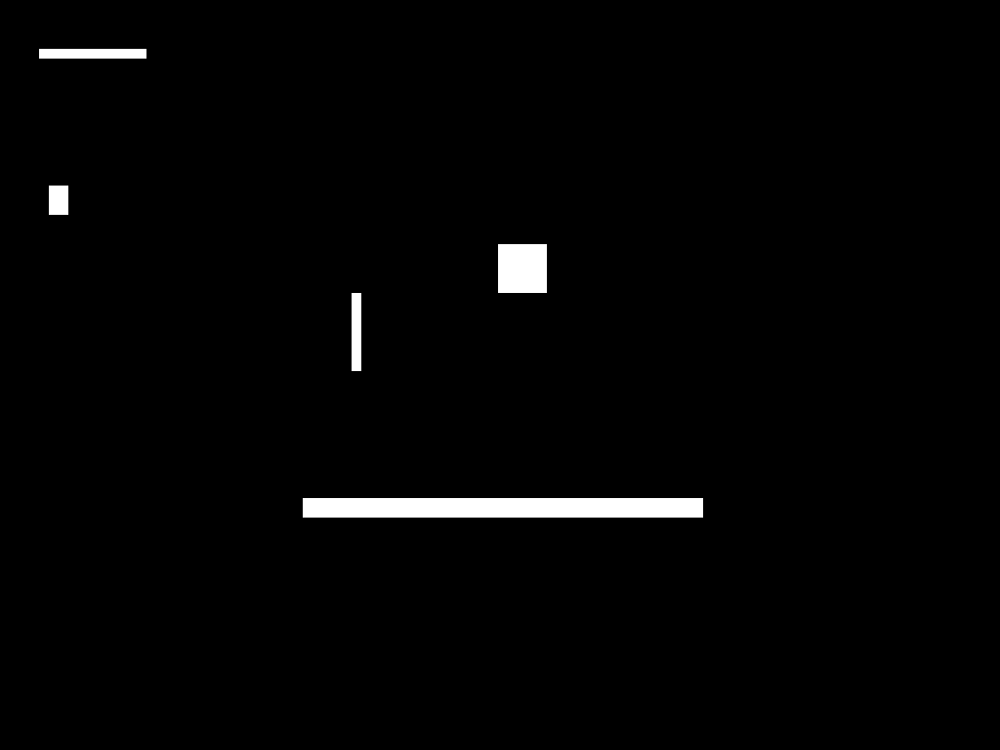

In [ ]:
skittles = cv2.imread('./skittles.jpg', cv2.IMREAD_COLOR)
skittles_inpaint_mask = np.zeros(skittles.shape[:2], np.uint8)
skittles_inpaint_mask[50:60, 40:150] = 255
skittles_inpaint_mask[190:220, 50:70] = 255
skittles_inpaint_mask[300:380, 360:370] = 255
skittles_inpaint_mask[250:300, 510:560] = 255
skittles_inpaint_mask[510:530, 310:720] = 255
imshow(skittles_inpaint_mask)

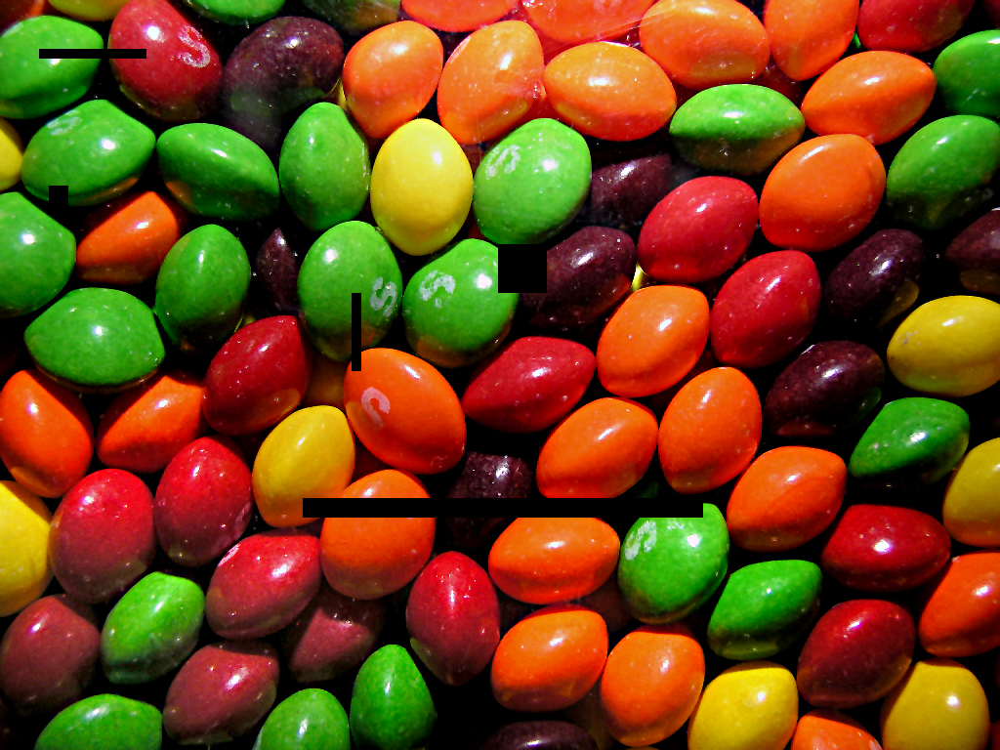

In [ ]:
skittles = cv2.bitwise_and(skittles, skittles, mask=~skittles_inpaint_mask)
imshow(skittles)

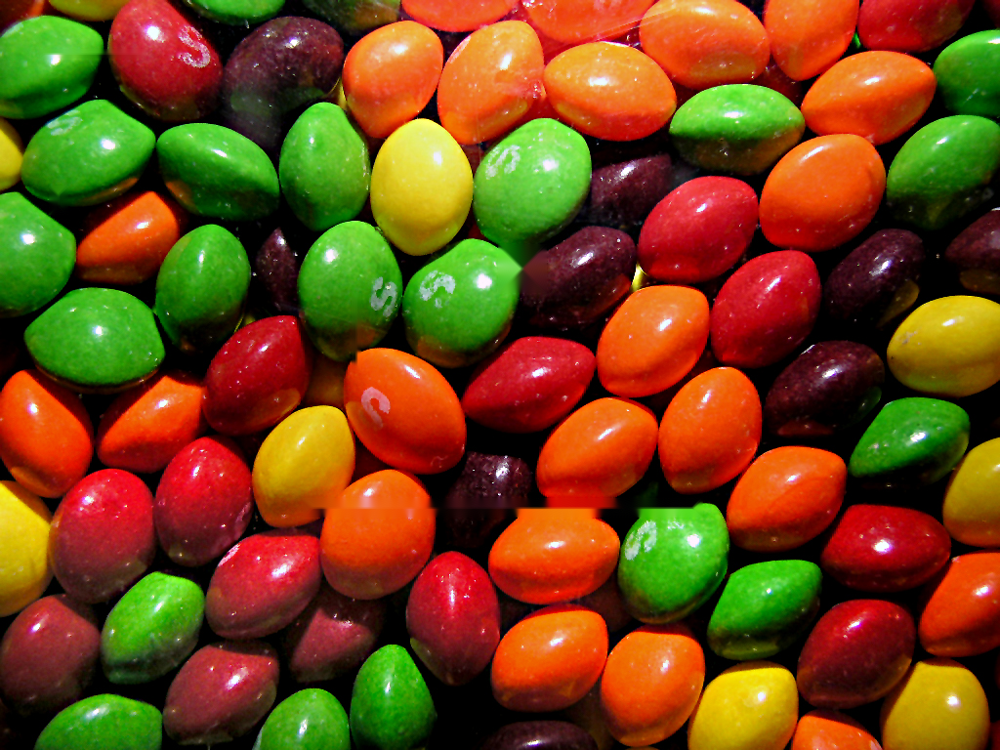

In [ ]:
skittles_inpaint = cv2.inpaint(skittles, skittles_inpaint_mask, 3, cv2.INPAINT_TELEA)
imshow(skittles_inpaint)

### HDR

Idea obrazu HDR wywodzi się z różnicy pomiędzy tym co technologia potrafi zapisać cyfrowo, a tym, co człowiek widzi na prawdę. Kamera, **dla pewnego zestawu ustawionych parametrów**, potrafi zapisać cyfrowo wyświetlony na matrycy obraz. Powstaje więc pytanie, jaki zestaw parametrów najlepiej odzwierciedla to, co widzi człowiek. Oraz bardziej szeroko: czy posiadając obecną technologię możemy jednym ujęciem (jednym zestawem parametrów) uzyskać obraz, który odzwierciedla to, co widzi człowiek.

Obecnie, do uzyskania obrazów HDR wykorzystuje się serię zdjęć zrobionych w możliwie jak najmniejszym odstępie czasowm, utworzonych z różnym czasem naświetlania matrycy. Seria ta, łączona jest w jeden obraz zgodnie z danym algorytmem.

OpenCV zawiera pare implementacji takich algorytmów, m.in.:
- cv2.createMergeDebevec()
- cv2.createMergeRobertson()
- cv2.createMergeMertens() - jako jedyny nie potrzebuje czasów naświetlania,

Ich wyniki zostały przedstawione poniżej.

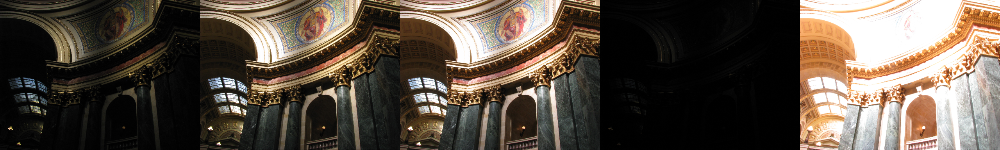

In [ ]:
hdr_images_paths = glob.glob('./hdr/aligned*.jpg')
hdr_images = [cv2.resize(cv2.imread(path, cv2.IMREAD_COLOR), None, fx=0.25, fy=0.25) for path in hdr_images_paths]

imshow(np.concatenate(random.sample(hdr_images, 5), 1))

In [ ]:
hdr_ex_t = [Image.open(path).getexif().get(33434) for path in hdr_images_paths]
hdr_ex_t = np.array([ext[0] / ext[1] for ext in hdr_ex_t], np.float32)

print('Czasy ekspozycji:\n', hdr_ex_t)

Czasy ekspozycji:
 [1.2500000e-01 2.0000000e-02 1.2500000e-02 1.5625000e-03 2.0000000e-01
 6.6666670e-02 6.0000002e-01 8.0000004e-03 2.5000000e-01 1.0000000e+00
 4.0000001e-01 2.0000001e-03 7.9999998e-04 3.3333335e-02 5.0000000e-01
 5.0000001e-02 2.5000000e-02 1.0000000e-01 6.2500001e-03 8.0000001e-01
 1.6666667e-01 1.6666668e-02 3.9999999e-02 3.1250000e-03 4.9999999e-03
 2.4999999e-03 1.3000000e+00 4.0000002e-03 7.6923080e-02 1.6000000e+00]


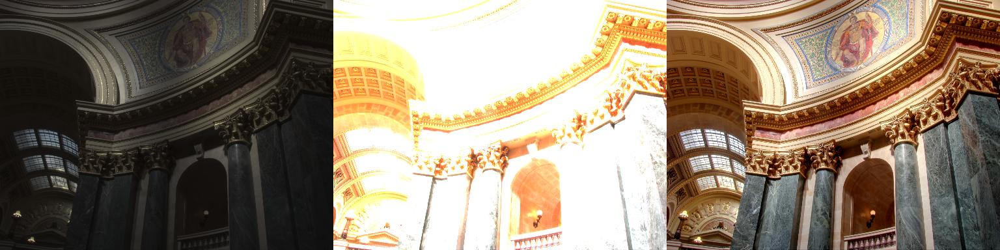

In [ ]:
tonemap = cv2.createTonemap(gamma=2.2)

merge_debevec = cv2.createMergeDebevec()
merge_robertson = cv2.createMergeRobertson()
merge_mertens = cv2.createMergeMertens()

hdr_debevec = merge_debevec.process(hdr_images, times=hdr_ex_t.copy())
hdr_robertson = merge_robertson.process(hdr_images, times=hdr_ex_t.copy())
hdr_mertens = merge_mertens.process(hdr_images)

hdr_debevec = tonemap.process(hdr_debevec.copy())

hdr_debevec = np.clip(hdr_debevec * 255, 0, 255).astype('uint8')
hdr_robertson = np.clip(hdr_robertson * 255, 0, 255).astype('uint8')
hdr_mertens = np.clip(hdr_mertens * 255, 0, 255).astype('uint8')

imshow(np.concatenate([hdr_debevec, hdr_robertson, hdr_mertens], 1))

# Wideo i 3D

## Usuwanie tła

Ze względu na wymagania obliczeniowe klasa algorytmów wykorzystywanych w obróbce wideo opiera się na iteracyjnym dostarczaniu informacji i wykorzystywaniu jej. 

Jednym z ważniejszych obszarów prac nad przetwarzaniem wideo jest wyszczególnienie tła oraz ruszających się elementów.

Poniżej zostały przedstawione dwa iteracyjne algorytmy maskowania tła ([A Duality Based Approach for Realtime TV-L1
Optical Flow](https://pequan.lip6.fr/~bereziat/cours/master/vision/papers/zach07.pdf)):
- cv2.createBackgroundSubtractorKNN()
- cv2.createBackgroundSubtractorMOG2()

Algorytmy te **uczą się** na podstawie kolejnych klatek filmu, opisując tło na podstawie tego, jak piksel i jego otoczenie się zmieniało.

In [ ]:
anymal = cv2.VideoCapture('./anymal_cut.mp4')
if anymal.isOpened():
    print('Film wczytany!')

anymal_width = int(anymal.get(3))
anymal_height = int(anymal.get(4))

print(anymal_height, anymal_width)

anymal_fps = anymal.get(cv2.CAP_PROP_FPS)
print(anymal_fps)

Film wczytany!
360 640
30.0


In [ ]:
Video.from_file('anymal_cut.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x0e1\x87mdat\x00\x…

In [ ]:
anymal_foreground_knn = cv2.VideoWriter('anymal_cut_foreground_knn.avi', cv2.VideoWriter_fourcc(*'DIVX'), anymal_fps, (anymal_width, anymal_height), 0)
anymal_foreground_mog2 = cv2.VideoWriter('anymal_cut_foreground_mog2.avi', cv2.VideoWriter_fourcc(*'DIVX'), anymal_fps, (anymal_width, anymal_height), 0)

foreground_knn = cv2.createBackgroundSubtractorKNN()
foreground_mog2 = cv2.createBackgroundSubtractorMOG2()

anymal.set(cv2.CAP_PROP_POS_FRAMES, 0)
while anymal.isOpened():
  ret, frame = anymal.read()

  if ret:
    anymal_foreground_knn.write(foreground_knn.apply(frame))
    anymal_foreground_mog2.write(foreground_mog2.apply(frame))
  else:
    break

anymal_foreground_knn.release()
anymal_foreground_mog2.release()

In [ ]:
!ffmpeg -hide_banner -loglevel error -i anymal_cut_foreground_knn.avi -y anymal_cut_foreground_knn.mp4
!ffmpeg -hide_banner -loglevel error -i anymal_cut_foreground_mog2.avi -y anymal_cut_foreground_mog2.mp4

In [ ]:
Video.from_file('anymal_cut_foreground_knn.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x002\xcf\x18mdat\x00\x…

In [ ]:
Video.from_file('anymal_cut_foreground_mog2.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x004R2mdat\x00\x00\x02…

## Śledzenie obiektów

Oprócz separacji elementów statycznych i dynamicznych na tle, można również wyróżnic klasę algorytmów śledzenia obiektów.

Sporym minusem klasycznych algorytmów w tej dziedzinie jest **wymóg wskazania elementu, który chcemy śledzić**. Algorytmy te implementuję jedynie funkcję śledzenia, nie detekcji.

Do podstawowych algorytmów zaliczamy:
- mean shift - algorytm iteracyjny, który sprawdza dopasowania w najbliższym otoczeniu obecnego dopasowania i porusza się w kierunku najlepszego z sąsiadów,
- cam shift - modyfikacja algorytmu mean shift, która dostosowuje również otoczenie (okno/bounding box) w kolejnych krokach,
- bardziej zaawansowane, również uczone:
  - Boosting,
  - MIL,
  - KCF,
  - TLF,
  - MedianFlow,
  - GOTURN,
  - MOSSE,
  - CSRT

In [ ]:
traffic = cv2.VideoCapture('./slow_traffic_small.mp4')
if traffic.isOpened():
    print('Film wczytany!')

traffic_width = int(traffic.get(3))
traffic_height = int(traffic.get(4))

print(traffic_height, traffic_width)

traffic_fps = traffic.get(cv2.CAP_PROP_FPS)
print(traffic_fps)

Film wczytany!
360 640
29.97002997002997


In [ ]:
Video.from_file('./slow_traffic_small.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1eD\xe4mdat\x00\x…

In [ ]:
traffic.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, frame = traffic.read()
x, y, w, h = 300, 200, 100, 50 # simply hardcoded the values
track_window = (x, y, w, h)
roi = frame[y:y+h, x:x+w]

hsv_roi =  cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv_roi, np.array((0., 60.,32.)), np.array((180.,255.,255.)))
roi_hist = cv2.calcHist([hsv_roi], [0], mask, [180], [0, 180])
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1 )

In [ ]:
traffic_track = cv2.VideoWriter('./slow_traffic_small_meanshift.avi', cv2.VideoWriter_fourcc(*'DIVX'), traffic_fps, (traffic_width, traffic_height))

traffic.set(cv2.CAP_PROP_POS_FRAMES, 0)
while traffic.isOpened():
    ret, frame = traffic.read()

    if ret:
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        dst = cv2.calcBackProject([hsv], [0], roi_hist, [0,180], 1)
        ret, track_window = cv2.meanShift(dst, track_window, term_crit)
        x, y, w, h = track_window
        traffic_track.write(cv2.rectangle(frame, (x,y), (x + w,y + h), 255, 2))
    else:
        break

traffic_track.release()

In [ ]:
!ffmpeg -hide_banner -loglevel error -i slow_traffic_small_meanshift.avi -y slow_traffic_small_meanshift.mp4

In [ ]:
Video.from_file('./slow_traffic_small_meanshift.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x19\xe5\x83mdat\x0…

In [ ]:
traffic.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, frame = traffic.read()
x, y, w, h = 300, 200, 100, 50 # simply hardcoded the values
track_window = (x, y, w, h)
roi = frame[y:y+h, x:x+w]

hsv_roi =  cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsv_roi, np.array((0., 60.,32.)), np.array((180.,255.,255.)))
roi_hist = cv2.calcHist([hsv_roi], [0], mask, [180], [0, 180])
cv2.normalize(roi_hist, roi_hist, 0, 255, cv2.NORM_MINMAX)
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1 )

In [ ]:
traffic_track = cv2.VideoWriter('./slow_traffic_small_camshift.avi', cv2.VideoWriter_fourcc(*'DIVX'), traffic_fps, (traffic_width, traffic_height))

traffic.set(cv2.CAP_PROP_POS_FRAMES, 0)
while traffic.isOpened():
    ret, frame = traffic.read()

    if ret:
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        dst = cv2.calcBackProject([hsv], [0], roi_hist, [0,180], 1)
        ret, track_window = cv2.CamShift(dst, track_window, term_crit)
        pts = np.int0(cv2.boxPoints(ret))
        traffic_track.write(cv2.polylines(frame, [pts], True, 255, 2))
    else:
        break

traffic_track.release()

In [ ]:
!ffmpeg -hide_banner -loglevel error -i slow_traffic_small_camshift.avi -y slow_traffic_small_camshift.mp4

In [ ]:
Video.from_file('./slow_traffic_small_camshift.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1e`\x1cmdat\x00\x…

In [ ]:
free_kick = cv2.VideoCapture("free_kick.mp4")
if free_kick.isOpened():
    print('Film wczytany!')

free_kick_width = int(free_kick.get(3))
free_kick_height = int(free_kick.get(4))

print(free_kick_height, free_kick_width)

free_kick_fps = free_kick.get(cv2.CAP_PROP_FPS)
print(free_kick_fps)

Film wczytany!
360 640
30.0


In [ ]:
def create_tracker(tracker_type):
  tracker_types = ['BOOSTING', 'MIL','KCF', 'TLD', 'MEDIANFLOW', 'GOTURN', 'MOSSE', 'CSRT']

  if tracker_type == 'BOOSTING':
      return cv2.TrackerBoosting_create()
  if tracker_type == 'MIL':
      return cv2.TrackerMIL_create()
  if tracker_type == 'KCF':
      return cv2.TrackerKCF_create()
  if tracker_type == 'TLD':
      return cv2.TrackerTLD_create()
  if tracker_type == 'MEDIANFLOW':
      return cv2.TrackerMedianFlow_create()
  if tracker_type == 'GOTURN':
      return cv2.TrackerGOTURN_create()
  if tracker_type == 'MOSSE':
      return cv2.TrackerMOSSE_create()
  if tracker_type == "CSRT":
      return cv2.TrackerCSRT_create()

def draw_bbox(frame, bbox, color=(255, 255, 255)):
  p1 = (int(bbox[0]), int(bbox[1]))
  p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
  cv2.rectangle(frame, p1, p2, color, 2, 1)

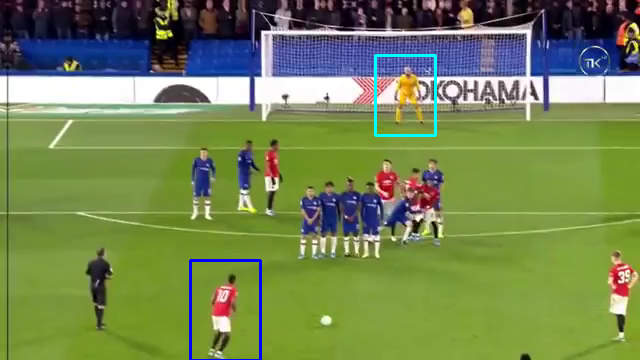

In [ ]:
free_kick.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, frame = free_kick.read()

player_bbox = (190, 260, 70, 100)
gkeeper_bbox = (375, 55, 60, 80)

draw_bbox(frame, player_bbox, (255, 0, 0))
draw_bbox(frame, gkeeper_bbox, (255, 255, 0))

imshow(frame)

In [ ]:
free_kick.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, frame = free_kick.read()

player_bbox = (190, 260, 70, 100)
gkeeper_bbox = (375, 55, 60, 80)

player_tracker = create_tracker('CSRT')
gkeeper_tracker = create_tracker('CSRT')

if player_tracker.init(frame, player_bbox):
  print('Algorytm śledządzy piłkarza zainicjalizowany w punkcie:', player_bbox)

if gkeeper_tracker.init(frame, gkeeper_bbox):
  print('Algorytm śledządzy bramkarza zainicjalizowany w punkcie:', gkeeper_bbox)

free_kick_track = cv2.VideoWriter('./free_kick_track.avi', cv2.VideoWriter_fourcc(*'DIVX'), free_kick_fps, (free_kick_width, free_kick_height))

free_kick.set(cv2.CAP_PROP_POS_FRAMES, 0)
while free_kick.isOpened():
    ret, frame = free_kick.read()

    if ret:
      ok, bbox = player_tracker.update(frame)
      if ok: draw_bbox(frame, bbox, (0, 255, 0))

      ok, bbox = gkeeper_tracker.update(frame)
      if ok: draw_bbox(frame, bbox, (0, 255, 0))

      free_kick_track.write(frame)
    else:
        break

free_kick_track.release()

Algorytm śledządzy piłkarza zainicjalizowany w punkcie: (190, 260, 70, 100)
Algorytm śledządzy bramkarza zainicjalizowany w punkcie: (375, 55, 60, 80)


In [ ]:
!ffmpeg -hide_banner -loglevel error -i free_kick_track.avi -y free_kick_track.mp4

In [ ]:
Video.from_file('./free_kick_track.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x07[\xcdmdat\x00\x…

## Ruch optyczny

Śledzenie obiektów zakłada rozpoznanie i znajomość pewnego rodzaju obiektów, które chcemy śledzić. Np. śledząc piłkarzy na boisku wiemy jak wyglądają (mamy pattern). Ogólnym przypadkiem śledzenia obiektów jest śledzenie ruchu optycznego. 

Przykładowo, piłkarz może poruszyć się do przodu. W przypadku gdy jest to próba kopnięcia piłki, piłkarz prawdopodobnie wykona ruch rękoma. Zarówno piłkarz (jako obiekt) poruszył się w jedną stronę jak i ręce (jako pod-obiekty) poruszyły się w inną stronę. 

Śledzenie ruchu optycznego schodzi jeszcze niżej i analizuje piksele i ich otoczenie, po pierwsze wyznaczająć punkty charakterystyczne na obrazie i po drugie śledząc je jako osobne obiekty.

In [ ]:
traffic = cv2.VideoCapture('./slow_traffic_small.mp4')
if traffic.isOpened():
    print('Film wczytany!')

traffic_width = int(traffic.get(3))
traffic_height = int(traffic.get(4))

print(traffic_height, traffic_width)

traffic_fps = traffic.get(cv2.CAP_PROP_FPS)
print(traffic_fps)

Film wczytany!
360 640
29.97002997002997


In [ ]:
Video.from_file('./slow_traffic_small.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1eD\xe4mdat\x00\x…

In [ ]:
feature_params = dict(maxCorners=100,
                      qualityLevel=0.3,
                      minDistance=7,
                      blockSize=7)
lk_params = dict(winSize=(15,15),
                 maxLevel=2,
                criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
# Create some random colors
color = np.random.randint(0,255,(100,3))

In [ ]:
traffic.set(cv2.CAP_PROP_POS_FRAMES, 0)
ret, old_frame = traffic.read()

old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
mask = np.zeros_like(old_frame)

In [ ]:
traffic_optical_flow = cv2.VideoWriter('./slow_traffic_small_optical_flow.avi', cv2.VideoWriter_fourcc(*'DIVX'), traffic_fps, (traffic_width, traffic_height))

traffic.set(cv2.CAP_PROP_POS_FRAMES, 0)
while traffic.isOpened():
  ret, frame = traffic.read()

  if ret:
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
    if p1 is not None:
      good_new = p1[st==1]
      good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new, good_old)):
      a,b = new.ravel()
      c,d = old.ravel()
      mask = cv2.line(mask, (int(a),int(b)),(int(c),int(d)), color[i].tolist(), 2)
      frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)

    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

    traffic_optical_flow.write(cv2.add(frame, mask))
  else:
      break

traffic_optical_flow.release()

In [ ]:
!ffmpeg -hide_banner -loglevel error -i slow_traffic_small_optical_flow.avi -y slow_traffic_small_optical_flow.mp4

In [ ]:
Video.from_file('./slow_traffic_small_optical_flow.mp4')

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00"X\x98mdat\x00\x00\…

# Zadanie

W ostatnich latach badania prowadzone w ramach widzenia komputerowego skupiły się na odkrywaniu na nowo możliwości rozwiązania problemów postawionych w zaprezentowanych wyżej działach (estymacja pozy, uzupełnienie obrazu, śledzenie obiektów, itp.) za pomocą technik uczenia maszynowego, w szczególności sieci neuronowych.

Zadanie polega na znalezieniu i **zreferowaniu** artykułu naukowego, który dotyczy jednego z poniżej wymienionych problemów (lub ich pokrewnych) i zajmuje się jego ponownym rozwiazaniem korzystając z najnowszych metod **uczenia maszynowego**:

- pose estimation,
- depth estimation - from stereo or single image,
- pattern recognition,
- image/video processing:
  - image superresolution,
  - super slow-motion,
  - video super-sampling,
  - image inpainting,
  - HDR,
- object detect and tracking,
- optical flow

Referat może przyjąć formę dokumentu PDF lub notatnika jupyter notebook. Dokument powinien zawierać **opis problemu** (np. jak dobrze wykonać wstępną detekcję obiektów przy problemie ich śledzenia), **wcześniej wykorzystywane metody** (np. progowanie, korelacja wzorców, itp.), **opis zaproponowanej metody w artykule** oraz prezentację **wyników działania metody**.

**Uwaga:**
- jeśli artykuł zawiera kod, można go zaprezentować w formie notebookowej

Przykładowe źródła artykułów:
- https://www.youtube.com/watch?v=gg0F5JjKmhA
- https://www.youtube.com/watch?v=ZXFmZsv0Ddw
- https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/
- CVF Conferences: https://openaccess.thecvf.com/menu
- papers with code: https://paperswithcode.com/area/computer-vision
